## Time Series Analysis

1. check stationarity
2. check seasonality and trend -> moving average, log transformation
3. 

In [1]:
# Import required libraries
import numpy as np
import pandas as pd, datetime

## Use case 1 : train_store_merged without filtering data of 180 stores

In [2]:
# Importing store data
train_store_merged = pd.read_csv('train_store_merged.csv')
train_store_merged.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Year,...,SalePerCustomer,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,2015,...,9.482883,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,1,4,2015-07-30,5020,546,1,1,0,1,2015,...,9.194139,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2,1,3,2015-07-29,4782,523,1,1,0,1,2015,...,9.143403,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
3,1,2,2015-07-28,5011,560,1,1,0,1,2015,...,8.948214,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
4,1,1,2015-07-27,6102,612,1,1,0,1,2015,...,9.970588,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0


In [3]:
train_store_merged.shape

(1017209, 23)

### Stationarity tests

## Dataset preparation

The dataset contains 4 different store types of a,b,c,d which represent differnt store models, so we will be analyzing one store from each store type so as to reflect the characteristics or pattern of sales for 4 store types

In [4]:
def extract_store_sales(train_store_merged):
    
    #Making date as index
    train_store_merged['Date'] = pd.to_datetime(train_store_merged.Date) # first converting type of column "Date" to DATETIME data type
    train_store_merged.set_index('Date', inplace = True) 
    
    #Extracting store number of each store type
    Store_a_number = train_store_merged.loc[train_store_merged['StoreType'] == 'a'].iloc[0].Store
    Store_b_number = train_store_merged.loc[train_store_merged['StoreType'] == 'b'].iloc[0].Store
    Store_c_number = train_store_merged.loc[train_store_merged['StoreType'] == 'c'].iloc[0].Store
    Store_d_number = train_store_merged.loc[train_store_merged['StoreType'] == 'd'].iloc[0].Store
    
    #Filtering out data for 1 store for each store type
    Store_a_sales = train_store_merged.loc[train_store_merged['Store'] == Store_a_number][['Sales']]
    Store_b_sales = train_store_merged.loc[train_store_merged['Store'] == Store_b_number][['Sales']]
    Store_c_sales = train_store_merged.loc[train_store_merged['Store'] == Store_c_number][['Sales']]
    Store_d_sales = train_store_merged.loc[train_store_merged['Store'] == Store_d_number][['Sales']]
    
  
    return (Store_a_sales, Store_b_sales, Store_c_sales, Store_d_sales)
    

In [5]:
train_store_merged_copy = train_store_merged.copy()

In [6]:
Store_a_sales, Store_b_sales, Store_c_sales, Store_d_sales = extract_store_sales(train_store_merged_copy)

In [7]:
import matplotlib.pyplot as plt
# Trend

f, (ax1, ax2, ax3, ax4) = plt.subplots(4, figsize = (12, 13))

Store_a_sales.plot(ax = ax1)
Store_b_sales.plot(ax = ax2)
Store_c_sales.plot(ax = ax3)
Store_d_sales.plot(ax = ax4)

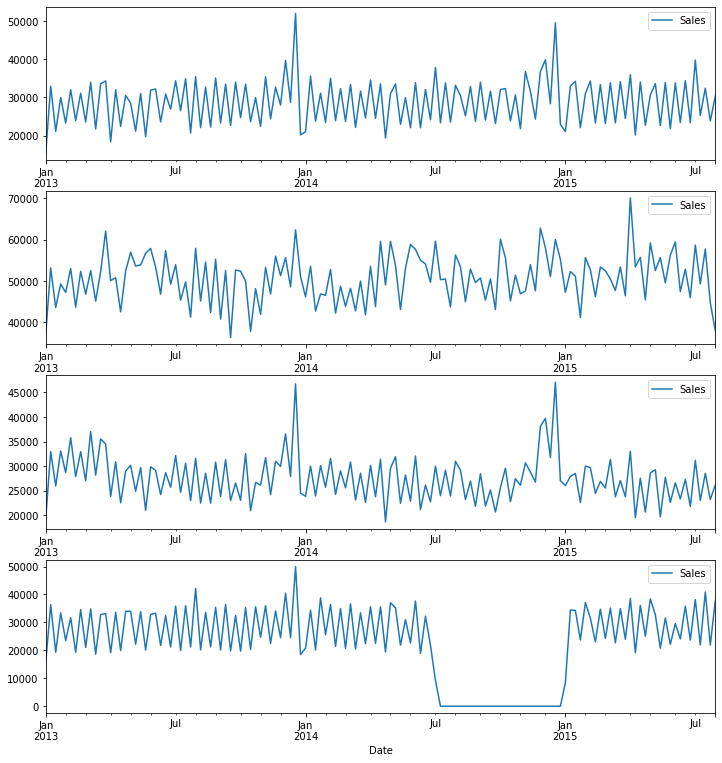

In [8]:
# Trend - Aggregating on weekly level to see the trend
f, (ax1, ax2, ax3, ax4) = plt.subplots(4, figsize = (12, 13))

Store_a_sales.resample('W').sum().plot(ax = ax1)
Store_b_sales.resample('W').sum().plot(ax = ax2)
Store_c_sales.resample('W').sum().plot(ax = ax3)
Store_d_sales.resample('W').sum().plot(ax = ax4)

## Here, we can see that
### 1. Store of store type d has shown 0 sales from july 2014 to jan 2015, which we also saw during EDA. The reason is that some of the stores were closed for refurbishment
### 2. The peak in sales are towards the end of year(Dec-Christmas season) for all store types

#### Checking Stationarity in time series - Augmented Dickey Fuller test

In [9]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

def stat_test_stationarity(series, title=''):
        
    dftest = sm.tsa.adfuller(series.dropna(), autolag = 'AIC', regression = 'ct')
    for key,val in dftest[4].items():
        print('critical value', key, val)
        
    if dftest[1] <= 0.05:      
        print('ADF Statistic: %f' % dftest[0])
        print('p-value: %f' % dftest[1])
        print("Strong evidence against Null Hypothesis")
        print("Reject Null Hypothesis - Data is Stationary")
        print("Data is Stationary", title)
    else:
        print('ADF Statistic: %f' % dftest[0])
        print('p-value: %f' % dftest[1])
        print("Strong evidence for  Null Hypothesis")
        print("Accept Null Hypothesis - Data is not Stationary")
        print("Data is NOT Stationary for", title)
        
    

In [10]:
stat_test_stationarity(Store_a_sales, "Store Sales")

critical value 1% -3.9686440853268574
critical value 5% -3.4152729079862536
critical value 10% -3.129865100810594
ADF Statistic: -6.471143
p-value: 0.000000
Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary Store Sales


In [11]:
stat_test_stationarity(Store_b_sales, "Store Sales")

critical value 1% -3.968654866669578
critical value 5% -3.415278124212735
critical value 10% -3.1298681691465235
ADF Statistic: -5.914196
p-value: 0.000003
Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary Store Sales


In [12]:
stat_test_stationarity(Store_c_sales, "Store Sales")

critical value 1% -3.9686440853268574
critical value 5% -3.4152729079862536
critical value 10% -3.129865100810594
ADF Statistic: -4.502746
p-value: 0.001494
Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary Store Sales


In [13]:
stat_test_stationarity(Store_d_sales, "Store Sales")

critical value 1% -3.971106390199908
critical value 5% -3.416463872525507
critical value 10% -3.1305655588156727
ADF Statistic: -6.489776
p-value: 0.000000
Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary Store Sales


In [14]:
#pip install pandas --upgrade

In [15]:
pd.__version__

'1.1.0'

In [16]:
import plotly

import plotly.graph_objs as go

plotly.offline.init_notebook_mode()

In [17]:
# Checking if there is a repeating pattern in original cycle and if it is there, we will see its cycle 
trace1 = go.Scatter(
    x = Store_a_sales.index,
    y = Store_a_sales.Sales
)

data0 = [trace1]

plotly.offline.iplot(data0)

### We can see here the pattern is repeating after a period of 14 days meaning there is seasonality.
### so we will keep window size of 14 for moving avergae

In [18]:
def plot_stationarity(series):

    moving_avg  = series.rolling(window = 14).mean()
    roll_std = series.rolling(window = 14).std()

    trace1 = go.Scatter(
        x = series.index,
        y = series.Sales,
        name = "Original signal"
    )

    trace2 = go.Scatter(
        x = series.index,
        y = moving_avg.Sales,
        name="Moving average (window = 14)"
    )
    
    trace3 = go.Scatter(
        x = series.index,
        y = roll_std.Sales,
        name="Rolling standard deviation (window = 14)"
    )
    
    data0 = [trace1, trace2,trace3]

    plotly.offline.iplot(data0)

    

In [19]:
plot_stationarity(Store_a_sales)

In [20]:
plot_stationarity(Store_b_sales)

In [21]:
plot_stationarity(Store_c_sales)

In [22]:
plot_stationarity(Store_d_sales)

### From p values from Dickey fuller test, we can see that the sales pattern of these 4 stores from different store types is stationary
### Also, from plots we can see that time series at day level is stationary

### Check Seasonality and Trend

In [23]:
#Decomposition is a way of removing seasonality and trend

from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose

def decompose(series):
    
    result = seasonal_decompose(series, model = 'additive', period = 365)
    
    trace0 = go.Scatter(
        x = series.index,
        y = result.observed,
    )
    
    trace1 = go.Scatter(
        x = series.index,
        y = result.trend,     
    )

    trace2 = go.Scatter(
        x = series.index,
        y = result.seasonal,       
    )
    
    trace3 = go.Scatter(
        x = series.index,
        y = result.resid,            
    )
    
    data0 = [trace0]
    data1 = [trace1]
    data2 = [trace2]
    data3 = [trace3]
    
#data0.update_layout(title = 'Original signal')

    plotly.offline.iplot(data0)
    plotly.offline.iplot(data1)
    plotly.offline.iplot(data2)
    plotly.offline.iplot(data3)
    

In [24]:
decompose(Store_a_sales)

In [25]:
def df_to_multiple_timeseries(train_store_merged):
    series, series_lstm = [], []
    
    train_store_merged['Date'] = pd.to_datetime(train_store_merged.Date) # first converting type of column "Date" to DATETIME data type
    #train_store_merged.set_index('Date', inplace = True)
       
    #Changing index name from 'Date' to 'ds'
    #train_store_merged.index.names = ['ds']
    # Converting col names to specific names as required by Prophet library
    train_store_merged = train_store_merged.rename(columns = {'Date':'ds','Sales': 'y'})
    #print(train_store_merged)   
    
    for i in range(1, 1116,1):
        series.append(train_store_merged[train_store_merged.Store == i][['ds','y']])
        #For LSTM
        temp = train_store_merged[train_store_merged.Store == i]['StoreType'].iloc[0]
        series_lstm.append([train_store_merged[train_store_merged.Store == i][['ds','y']],i, temp])
                      
    return (series, series_lstm)
                          

In [26]:
train_store_merged_copy1 = train_store_merged.copy()

In [27]:
series, series_lstm = df_to_multiple_timeseries(train_store_merged_copy1)

In [28]:
series

[            ds     y
 0   2015-07-31  5263
 1   2015-07-30  5020
 2   2015-07-29  4782
 3   2015-07-28  5011
 4   2015-07-27  6102
 ..         ...   ...
 937 2013-01-05  4997
 938 2013-01-04  4486
 939 2013-01-03  4327
 940 2013-01-02  5530
 941 2013-01-01     0
 
 [942 rows x 2 columns],              ds     y
 942  2015-07-31  6064
 943  2015-07-30  5567
 944  2015-07-29  6402
 945  2015-07-28  5671
 946  2015-07-27  6627
 ...         ...   ...
 1879 2013-01-05  2342
 1880 2013-01-04  4484
 1881 2013-01-03  4159
 1882 2013-01-02  4422
 1883 2013-01-01     0
 
 [942 rows x 2 columns],              ds     y
 1884 2015-07-31  8314
 1885 2015-07-30  8977
 1886 2015-07-29  7610
 1887 2015-07-28  8864
 1888 2015-07-27  8107
 ...         ...   ...
 2821 2013-01-05  4523
 2822 2013-01-04  6069
 2823 2013-01-03  5902
 2824 2013-01-02  6823
 2825 2013-01-01     0
 
 [942 rows x 2 columns],              ds      y
 2826 2015-07-31  13995
 2827 2015-07-30  10387
 2828 2015-07-29  10514
 2829 2015

In [29]:
import pickle

with open('series_lstm.pkl', 'wb') as f:
    pickle.dump(series_lstm, f)

In [30]:
series

[            ds     y
 0   2015-07-31  5263
 1   2015-07-30  5020
 2   2015-07-29  4782
 3   2015-07-28  5011
 4   2015-07-27  6102
 ..         ...   ...
 937 2013-01-05  4997
 938 2013-01-04  4486
 939 2013-01-03  4327
 940 2013-01-02  5530
 941 2013-01-01     0
 
 [942 rows x 2 columns],              ds     y
 942  2015-07-31  6064
 943  2015-07-30  5567
 944  2015-07-29  6402
 945  2015-07-28  5671
 946  2015-07-27  6627
 ...         ...   ...
 1879 2013-01-05  2342
 1880 2013-01-04  4484
 1881 2013-01-03  4159
 1882 2013-01-02  4422
 1883 2013-01-01     0
 
 [942 rows x 2 columns],              ds     y
 1884 2015-07-31  8314
 1885 2015-07-30  8977
 1886 2015-07-29  7610
 1887 2015-07-28  8864
 1888 2015-07-27  8107
 ...         ...   ...
 2821 2013-01-05  4523
 2822 2013-01-04  6069
 2823 2013-01-03  5902
 2824 2013-01-02  6823
 2825 2013-01-01     0
 
 [942 rows x 2 columns],              ds      y
 2826 2015-07-31  13995
 2827 2015-07-30  10387
 2828 2015-07-29  10514
 2829 2015

In [31]:
#pip install pystan

In [32]:
#pip install fbprophet

In [33]:
#pip install tqdm

In [34]:
    
def train_test_split(series_copy):
    series_train = []
    series_test = []
    for df in series_copy:
        temp_df_train = df[df["ds"] < '2015-05-01']        
        temp_df_train.sort_values(by = 'ds', inplace = True )
        temp_df_train.reset_index(drop = True, inplace = True )
        
        temp_df_test = df[df["ds"] >= '2015-05-01']
        temp_df_test.sort_values(by = 'ds', inplace = True )
        temp_df_test.reset_index(drop = True, inplace = True)
        
        series_train.append(temp_df_train)
        series_test.append(temp_df_test)
        
    return(series_train,series_test)
    

In [35]:
series_copy = series.copy()

In [36]:
series_train,series_test = train_test_split(series_copy)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [37]:
series_train

[            ds     y
 0   2013-01-01     0
 1   2013-01-02  5530
 2   2013-01-03  4327
 3   2013-01-04  4486
 4   2013-01-05  4997
 ..         ...   ...
 845 2015-04-26     0
 846 2015-04-27  5575
 847 2015-04-28  5199
 848 2015-04-29  5775
 849 2015-04-30  6228
 
 [850 rows x 2 columns],             ds     y
 0   2013-01-01     0
 1   2013-01-02  4422
 2   2013-01-03  4159
 3   2013-01-04  4484
 4   2013-01-05  2342
 ..         ...   ...
 845 2015-04-26     0
 846 2015-04-27  6523
 847 2015-04-28  6861
 848 2015-04-29  6764
 849 2015-04-30  6884
 
 [850 rows x 2 columns],             ds     y
 0   2013-01-01     0
 1   2013-01-02  6823
 2   2013-01-03  5902
 3   2013-01-04  6069
 4   2013-01-05  4523
 ..         ...   ...
 845 2015-04-26     0
 846 2015-04-27  9447
 847 2015-04-28  8758
 848 2015-04-29  9484
 849 2015-04-30  9971
 
 [850 rows x 2 columns],             ds      y
 0   2013-01-01      0
 1   2013-01-02   9941
 2   2013-01-03   8247
 3   2013-01-04   8290
 4   2013-01-05

In [38]:
series_test

[           ds     y
 0  2015-05-01     0
 1  2015-05-02  5850
 2  2015-05-03     0
 3  2015-05-04  5591
 4  2015-05-05  4564
 ..        ...   ...
 87 2015-07-27  6102
 88 2015-07-28  5011
 89 2015-07-29  4782
 90 2015-07-30  5020
 91 2015-07-31  5263
 
 [92 rows x 2 columns],            ds     y
 0  2015-05-01     0
 1  2015-05-02  3590
 2  2015-05-03     0
 3  2015-05-04  6901
 4  2015-05-05  6295
 ..        ...   ...
 87 2015-07-27  6627
 88 2015-07-28  5671
 89 2015-07-29  6402
 90 2015-07-30  5567
 91 2015-07-31  6064
 
 [92 rows x 2 columns],            ds     y
 0  2015-05-01     0
 1  2015-05-02  6564
 2  2015-05-03     0
 3  2015-05-04  9488
 4  2015-05-05  8719
 ..        ...   ...
 87 2015-07-27  8107
 88 2015-07-28  8864
 89 2015-07-29  7610
 90 2015-07-30  8977
 91 2015-07-31  8314
 
 [92 rows x 2 columns],            ds      y
 0  2015-05-01      0
 1  2015-05-02  12750
 2  2015-05-03      0
 3  2015-05-04  11942
 4  2015-05-05   9583
 ..        ...    ...
 87 2015-07-27 

In [39]:
# Creating holidays dataframe to include it in the Prophet model
state_dates = train_store_merged[(train_store_merged.StateHoliday == 'a') | (train_store_merged.StateHoliday == 'b') & (train_store_merged.StateHoliday == 'c')].loc[:, 'Date'].values
school_dates = train_store_merged[train_store_merged.SchoolHoliday == 1].loc[:, 'Date'].values

state = pd.DataFrame({'holiday': 'state_holiday',
                   'ds': pd.to_datetime(state_dates)})
school = pd.DataFrame({'holiday': 'school_holiday',
                   'ds': pd.to_datetime(school_dates)})

holidays = pd.concat((state, school)) 	 
holidays.head()


,holiday,ds
0,state_holiday,2015-06-04
1,state_holiday,2015-05-25
2,state_holiday,2015-05-14
3,state_holiday,2015-05-01
4,state_holiday,2015-01-01


In [48]:
#With Holidays
from fbprophet import Prophet

def run_prophet(series):
    model = Prophet(yearly_seasonality = False, daily_seasonality = False, weekly_seasonality = True, holidays = holidays, interval_width = 0.95)
    model.fit(series)
    
    forecast = model.make_future_dataframe(periods = 92, include_history=False)
    
    forecast = model.predict(forecast)
    
    return forecast

In [49]:
#run_prophet(series[0])

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,holidays,...,state_holiday,state_holiday_lower,state_holiday_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-08-01,3766.562206,2431.874808,7140.549172,3766.562206,3766.562206,998.969532,998.969532,998.969532,0.0,...,0.0,0.0,0.0,998.969532,998.969532,998.969532,0.0,0.0,0.0,4765.531738
1,2015-08-02,3766.189385,-2577.963565,2243.508429,3766.189161,3766.189385,-3943.704128,-3943.704128,-3943.704128,0.0,...,0.0,0.0,0.0,-3943.704128,-3943.704128,-3943.704128,0.0,0.0,0.0,-177.514742
2,2015-08-03,3765.816564,2675.818356,7055.404589,3765.815408,3765.817030,1002.865810,1002.865810,1002.865810,0.0,...,0.0,0.0,0.0,1002.865810,1002.865810,1002.865810,0.0,0.0,0.0,4768.682374
3,2015-08-04,3765.443744,2178.258053,6693.548260,3765.441469,3765.444791,706.736541,706.736541,706.736541,0.0,...,0.0,0.0,0.0,706.736541,706.736541,706.736541,0.0,0.0,0.0,4472.180285
4,2015-08-05,3765.070923,1852.403250,6814.049773,3765.067116,3765.073122,510.652970,510.652970,510.652970,0.0,...,0.0,0.0,0.0,510.652970,510.652970,510.652970,0.0,0.0,0.0,4275.723892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,2015-10-27,3734.126788,2184.231351,6609.312574,3733.743881,3734.440910,706.736541,706.736541,706.736541,0.0,...,0.0,0.0,0.0,706.736541,706.736541,706.736541,0.0,0.0,0.0,4440.863329
88,2015-10-28,3733.753967,1963.219701,6554.496157,3733.365081,3734.073566,510.652970,510.652970,510.652970,0.0,...,0.0,0.0,0.0,510.652970,510.652970,510.652970,0.0,0.0,0.0,4244.406937
89,2015-10-29,3733.381146,1719.511159,6211.948065,3732.986280,3733.705929,151.137435,151.137435,151.137435,0.0,...,0.0,0.0,0.0,151.137435,151.137435,151.137435,0.0,0.0,0.0,3884.518581
90,2015-10-30,3733.008325,1848.801024,6673.134656,3732.607480,3733.338439,573.341840,573.341840,573.341840,0.0,...,0.0,0.0,0.0,573.341840,573.341840,573.341840,0.0,0.0,0.0,4306.350165


In [51]:
#Without Holidays
from fbprophet import Prophet

def run_prophet(series):
    model = Prophet(yearly_seasonality = False, daily_seasonality = False, weekly_seasonality = True)#, holidays = holidays, interval_width = 0.95)
    model.fit(series)
    
    forecast = model.make_future_dataframe(periods = 92, include_history=False)
    
    forecast = model.predict(forecast)
    
    return forecast

In [52]:
from multiprocessing import Pool, cpu_count
from tqdm import tqdm

p = Pool(cpu_count())
predictions = list(tqdm(p.imap(run_prophet, series_train), total = len(series_train)))
p.close()
p.join()




  0%|          | 0/1115 [00:00<?, ?it/s]

  0%|          | 1/1115 [00:05<1:42:32,  5.52s/it]

  0%|          | 3/1115 [00:05<1:11:58,  3.88s/it]

  0%|          | 4/1115 [00:05<51:17,  2.77s/it]  

  0%|          | 5/1115 [00:10<1:03:11,  3.42s/it]

  1%|          | 6/1115 [00:10<45:16,  2.45s/it]  

  1%|          | 7/1115 [00:11<32:36,  1.77s/it]

  1%|          | 9/1115 [00:16<36:22,  1.97s/it]

  1%|          | 10/1115 [00:16<27:32,  1.50s/it]

  1%|          | 13/1115 [00:21<28:25,  1.55s/it]

  1%|▏         | 14/1115 [00:21<21:57,  1.20s/it]

  1%|▏         | 15/1115 [00:21<16:10,  1.13it/s]

  2%|▏         | 17/1115 [00:26<24:26,  1.34s/it]

  2%|▏         | 18/1115 [00:27<19:13,  1.05s/it]

  2%|▏         | 20/1115 [00:27<14:14,  1.28it/s]

  2%|▏         | 21/1115 [00:32<39:23,  2.16s/it]

  2%|▏         | 22/1115 [00:33<29:52,  1.64s/it]

  2%|▏         | 24/1115 [00:33<21:25,  1.18s/it]

  2%|▏         | 25/1115 [00:37<39:00,  2.15s/it]

  2%|▏         | 26/1115 [00:38<29:

 16%|█▌        | 175/1115 [04:00<19:30,  1.25s/it]

 16%|█▌        | 176/1115 [04:01<15:25,  1.01it/s]

 16%|█▌        | 177/1115 [04:05<31:49,  2.04s/it]

 16%|█▌        | 178/1115 [04:06<23:30,  1.50s/it]

 16%|█▌        | 180/1115 [04:06<17:21,  1.11s/it]

 16%|█▌        | 181/1115 [04:11<33:29,  2.15s/it]

 16%|█▋        | 183/1115 [04:11<24:07,  1.55s/it]

 17%|█▋        | 184/1115 [04:11<18:30,  1.19s/it]

 17%|█▋        | 185/1115 [04:16<33:18,  2.15s/it]

 17%|█▋        | 187/1115 [04:16<24:14,  1.57s/it]

 17%|█▋        | 188/1115 [04:16<17:39,  1.14s/it]

 17%|█▋        | 189/1115 [04:21<33:55,  2.20s/it]

 17%|█▋        | 191/1115 [04:21<24:37,  1.60s/it]

 17%|█▋        | 192/1115 [04:21<17:46,  1.16s/it]

 17%|█▋        | 193/1115 [04:26<33:36,  2.19s/it]

 17%|█▋        | 195/1115 [04:26<24:07,  1.57s/it]

 18%|█▊        | 196/1115 [04:26<17:49,  1.16s/it]

 18%|█▊        | 197/1115 [04:31<33:22,  2.18s/it]

 18%|█▊        | 198/1115 [04:31<24:22,  1.60s/it]

 18%|█▊     

 32%|███▏      | 353/1115 [08:04<20:27,  1.61s/it]

 32%|███▏      | 354/1115 [08:04<14:50,  1.17s/it]

 32%|███▏      | 355/1115 [08:05<12:42,  1.00s/it]

 32%|███▏      | 356/1115 [08:05<10:16,  1.23it/s]

 32%|███▏      | 357/1115 [08:09<22:30,  1.78s/it]

 32%|███▏      | 359/1115 [08:10<17:30,  1.39s/it]

 32%|███▏      | 360/1115 [08:10<12:57,  1.03s/it]

 32%|███▏      | 361/1115 [08:14<24:08,  1.92s/it]

 32%|███▏      | 362/1115 [08:15<17:19,  1.38s/it]

 33%|███▎      | 363/1115 [08:16<15:52,  1.27s/it]

 33%|███▎      | 364/1115 [08:16<11:31,  1.09it/s]

 33%|███▎      | 365/1115 [08:19<22:19,  1.79s/it]

 33%|███▎      | 366/1115 [08:20<16:42,  1.34s/it]

 33%|███▎      | 367/1115 [08:21<15:18,  1.23s/it]

 33%|███▎      | 368/1115 [08:21<11:15,  1.11it/s]

 33%|███▎      | 369/1115 [08:25<21:55,  1.76s/it]

 33%|███▎      | 370/1115 [08:25<16:11,  1.30s/it]

 33%|███▎      | 371/1115 [08:26<14:49,  1.20s/it]

 33%|███▎      | 372/1115 [08:26<11:16,  1.10it/s]

 33%|███▎   

 46%|████▌     | 508/1115 [11:28<11:00,  1.09s/it]

 46%|████▌     | 509/1115 [11:32<17:58,  1.78s/it]

 46%|████▌     | 510/1115 [11:33<14:36,  1.45s/it]

 46%|████▌     | 511/1115 [11:34<15:25,  1.53s/it]

 46%|████▌     | 512/1115 [11:35<12:58,  1.29s/it]

 46%|████▌     | 513/1115 [11:40<24:08,  2.41s/it]

 46%|████▌     | 514/1115 [11:41<19:21,  1.93s/it]

 46%|████▌     | 515/1115 [11:42<17:25,  1.74s/it]

 46%|████▋     | 516/1115 [11:43<13:32,  1.36s/it]

 46%|████▋     | 517/1115 [11:46<18:24,  1.85s/it]

 46%|████▋     | 518/1115 [11:46<13:44,  1.38s/it]

 47%|████▋     | 519/1115 [11:47<13:15,  1.34s/it]

 47%|████▋     | 520/1115 [11:48<10:44,  1.08s/it]

 47%|████▋     | 521/1115 [11:51<17:08,  1.73s/it]

 47%|████▋     | 523/1115 [11:52<13:52,  1.41s/it]

 47%|████▋     | 524/1115 [11:53<11:07,  1.13s/it]

 47%|████▋     | 525/1115 [11:55<14:19,  1.46s/it]

 47%|████▋     | 527/1115 [11:56<11:38,  1.19s/it]

 47%|████▋     | 528/1115 [11:56<08:37,  1.13it/s]

 47%|████▋  

 59%|█████▉    | 663/1115 [13:49<07:02,  1.07it/s]

 60%|█████▉    | 664/1115 [13:50<05:48,  1.30it/s]

 60%|█████▉    | 665/1115 [13:51<07:55,  1.06s/it]

 60%|█████▉    | 667/1115 [13:52<06:44,  1.11it/s]

 60%|█████▉    | 668/1115 [13:53<05:44,  1.30it/s]

 60%|██████    | 669/1115 [13:54<07:32,  1.01s/it]

 60%|██████    | 671/1115 [13:56<06:32,  1.13it/s]

 60%|██████    | 672/1115 [13:56<05:41,  1.30it/s]

 60%|██████    | 673/1115 [13:58<07:36,  1.03s/it]

 61%|██████    | 675/1115 [13:59<06:21,  1.15it/s]

 61%|██████    | 676/1115 [13:59<05:35,  1.31it/s]

 61%|██████    | 677/1115 [14:01<07:50,  1.07s/it]

 61%|██████    | 678/1115 [14:01<05:57,  1.22it/s]

 61%|██████    | 679/1115 [14:02<06:35,  1.10it/s]

 61%|██████    | 680/1115 [14:03<05:29,  1.32it/s]

 61%|██████    | 681/1115 [14:04<07:16,  1.01s/it]

 61%|██████    | 682/1115 [14:05<05:36,  1.29it/s]

 61%|██████▏   | 683/1115 [14:06<06:49,  1.06it/s]

 61%|██████▏   | 684/1115 [14:06<05:48,  1.24it/s]

 61%|██████▏

 73%|███████▎  | 815/1115 [16:00<04:04,  1.23it/s]

 73%|███████▎  | 816/1115 [16:01<04:34,  1.09it/s]

 73%|███████▎  | 817/1115 [16:02<04:42,  1.05it/s]

 73%|███████▎  | 818/1115 [16:02<03:26,  1.44it/s]

 73%|███████▎  | 819/1115 [16:03<03:32,  1.39it/s]

 74%|███████▎  | 820/1115 [16:04<03:40,  1.34it/s]

 74%|███████▎  | 821/1115 [16:05<03:49,  1.28it/s]

 74%|███████▎  | 822/1115 [16:05<02:49,  1.73it/s]

 74%|███████▍  | 823/1115 [16:06<03:03,  1.59it/s]

 74%|███████▍  | 824/1115 [16:07<03:25,  1.42it/s]

 74%|███████▍  | 825/1115 [16:07<03:34,  1.35it/s]

 74%|███████▍  | 826/1115 [16:07<02:39,  1.81it/s]

 74%|███████▍  | 827/1115 [16:08<02:55,  1.64it/s]

 74%|███████▍  | 828/1115 [16:09<03:12,  1.49it/s]

 74%|███████▍  | 829/1115 [16:10<03:22,  1.41it/s]

 74%|███████▍  | 830/1115 [16:10<02:51,  1.66it/s]

 75%|███████▍  | 831/1115 [16:11<03:01,  1.56it/s]

 75%|███████▍  | 832/1115 [16:12<03:18,  1.42it/s]

 75%|███████▍  | 833/1115 [16:12<03:19,  1.42it/s]

 75%|███████

 87%|████████▋ | 971/1115 [17:43<01:45,  1.37it/s]

 87%|████████▋ | 972/1115 [17:44<01:50,  1.29it/s]

 87%|████████▋ | 973/1115 [17:45<01:40,  1.41it/s]

 87%|████████▋ | 975/1115 [17:46<01:32,  1.51it/s]

 88%|████████▊ | 976/1115 [17:47<01:41,  1.37it/s]

 88%|████████▊ | 977/1115 [17:47<01:34,  1.46it/s]

 88%|████████▊ | 978/1115 [17:48<01:13,  1.86it/s]

 88%|████████▊ | 979/1115 [17:49<01:35,  1.43it/s]

 88%|████████▊ | 980/1115 [17:50<01:41,  1.33it/s]

 88%|████████▊ | 981/1115 [17:50<01:25,  1.56it/s]

 88%|████████▊ | 982/1115 [17:50<01:07,  1.98it/s]

 88%|████████▊ | 983/1115 [17:51<01:26,  1.52it/s]

 88%|████████▊ | 984/1115 [17:52<01:36,  1.36it/s]

 88%|████████▊ | 985/1115 [17:52<01:25,  1.52it/s]

 88%|████████▊ | 986/1115 [17:53<01:16,  1.68it/s]

 89%|████████▊ | 987/1115 [17:54<01:30,  1.41it/s]

 89%|████████▊ | 988/1115 [17:55<01:29,  1.42it/s]

 89%|████████▊ | 989/1115 [17:55<01:18,  1.60it/s]

 89%|████████▉ | 990/1115 [17:55<01:09,  1.79it/s]

 89%|███████

In [53]:
len(series_test)

1115

In [54]:
len(predictions)

1115

In [55]:
# import time
# print("--- %s seconds ---" % (time.time() - start_time))

In [56]:
predictions

[           ds        trend   yhat_lower   yhat_upper  trend_lower  \
 0  2015-05-01  3925.103167  2926.755519  6034.099721  3925.103167   
 1  2015-05-02  3925.152642  3314.844765  6345.166636  3925.152642   
 2  2015-05-03  3925.202116 -1676.893087  1584.816381  3925.202116   
 3  2015-05-04  3925.251591  3387.992439  6499.184448  3925.251591   
 4  2015-05-05  3925.301065  3078.168352  6163.344033  3925.301065   
 ..        ...          ...          ...          ...          ...   
 87 2015-07-27  3929.407459  3337.663129  6422.634526  3924.842727   
 88 2015-07-28  3929.456934  3065.623050  6142.678385  3924.776339   
 89 2015-07-29  3929.506409  3015.467447  5905.202750  3924.769073   
 90 2015-07-30  3929.555883  2576.470717  5512.219632  3924.700475   
 91 2015-07-31  3929.605358  2924.809386  6006.254471  3924.674453   
 
     trend_upper  additive_terms  additive_terms_lower  additive_terms_upper  \
 0   3925.103167      593.513315            593.513315            593.513315  

In [57]:
predictions[0]

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-05-01,3925.103167,2926.755519,6034.099721,3925.103167,3925.103167,593.513315,593.513315,593.513315,593.513315,593.513315,593.513315,0.0,0.0,0.0,4518.616482
1,2015-05-02,3925.152642,3314.844765,6345.166636,3925.152642,3925.152642,1013.347297,1013.347297,1013.347297,1013.347297,1013.347297,1013.347297,0.0,0.0,0.0,4938.499939
2,2015-05-03,3925.202116,-1676.893087,1584.816381,3925.202116,3925.202116,-3974.878066,-3974.878066,-3974.878066,-3974.878066,-3974.878066,-3974.878066,0.0,0.0,0.0,-49.675950
3,2015-05-04,3925.251591,3387.992439,6499.184448,3925.251591,3925.251591,1017.494490,1017.494490,1017.494490,1017.494490,1017.494490,1017.494490,0.0,0.0,0.0,4942.746081
4,2015-05-05,3925.301065,3078.168352,6163.344033,3925.301065,3925.301065,689.249921,689.249921,689.249921,689.249921,689.249921,689.249921,0.0,0.0,0.0,4614.550986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,2015-07-27,3929.407459,3337.663129,6422.634526,3924.842727,3933.051990,1017.494490,1017.494490,1017.494490,1017.494490,1017.494490,1017.494490,0.0,0.0,0.0,4946.901950
88,2015-07-28,3929.456934,3065.623050,6142.678385,3924.776339,3933.180928,689.249921,689.249921,689.249921,689.249921,689.249921,689.249921,0.0,0.0,0.0,4618.706855
89,2015-07-29,3929.506409,3015.467447,5905.202750,3924.769073,3933.298526,489.906810,489.906810,489.906810,489.906810,489.906810,489.906810,0.0,0.0,0.0,4419.413218
90,2015-07-30,3929.555883,2576.470717,5512.219632,3924.700475,3933.408155,171.366233,171.366233,171.366233,171.366233,171.366233,171.366233,0.0,0.0,0.0,4100.922116


In [58]:
# series_test_copy = series_test.copy()

In [59]:
# for df in series_test_copy:
#     df.sort_values(by = 'ds', inplace = True )
#     df.reset_index(drop=True, inplace= True)

In [60]:
predictions

[           ds        trend   yhat_lower   yhat_upper  trend_lower  \
 0  2015-05-01  3925.103167  2926.755519  6034.099721  3925.103167   
 1  2015-05-02  3925.152642  3314.844765  6345.166636  3925.152642   
 2  2015-05-03  3925.202116 -1676.893087  1584.816381  3925.202116   
 3  2015-05-04  3925.251591  3387.992439  6499.184448  3925.251591   
 4  2015-05-05  3925.301065  3078.168352  6163.344033  3925.301065   
 ..        ...          ...          ...          ...          ...   
 87 2015-07-27  3929.407459  3337.663129  6422.634526  3924.842727   
 88 2015-07-28  3929.456934  3065.623050  6142.678385  3924.776339   
 89 2015-07-29  3929.506409  3015.467447  5905.202750  3924.769073   
 90 2015-07-30  3929.555883  2576.470717  5512.219632  3924.700475   
 91 2015-07-31  3929.605358  2924.809386  6006.254471  3924.674453   
 
     trend_upper  additive_terms  additive_terms_lower  additive_terms_upper  \
 0   3925.103167      593.513315            593.513315            593.513315  

In [61]:
# series_test_copy

In [62]:
len(predictions[0])

92

In [63]:
# adding predicted and test side by side
result = pd.DataFrame()
result_list = []

for i in range(0,1115,1):
    dfinal = predictions[i].merge(series_test[i], on = "ds", how = 'inner')
    result_list.append(dfinal)
    
    result = result.append(dfinal)
    

In [64]:
len(result_list)

1115

In [65]:
result.shape

(102580, 17)

In [66]:
result.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat,y
0,2015-05-01,3925.103167,2926.755519,6034.099721,3925.103167,3925.103167,593.513315,593.513315,593.513315,593.513315,593.513315,593.513315,0.0,0.0,0.0,4518.616482,0
1,2015-05-02,3925.152642,3314.844765,6345.166636,3925.152642,3925.152642,1013.347297,1013.347297,1013.347297,1013.347297,1013.347297,1013.347297,0.0,0.0,0.0,4938.499939,5850
2,2015-05-03,3925.202116,-1676.893087,1584.816381,3925.202116,3925.202116,-3974.878066,-3974.878066,-3974.878066,-3974.878066,-3974.878066,-3974.878066,0.0,0.0,0.0,-49.675950,0
3,2015-05-04,3925.251591,3387.992439,6499.184448,3925.251591,3925.251591,1017.494490,1017.494490,1017.494490,1017.494490,1017.494490,1017.494490,0.0,0.0,0.0,4942.746081,5591
4,2015-05-05,3925.301065,3078.168352,6163.344033,3925.301065,3925.301065,689.249921,689.249921,689.249921,689.249921,689.249921,689.249921,0.0,0.0,0.0,4614.550986,4564


In [67]:
def plot_results(sales_actual_pred):
    trace1 = go.Scatter(
            x = sales_actual_pred.ds,
            y = sales_actual_pred.yhat,
            name = "Predicted Sales"
        )

    trace2 = go.Scatter(
        x = sales_actual_pred.ds,
        y = sales_actual_pred.y,
        name="Actual Sales"
    )

    data0 = [trace1, trace2]

    plotly.offline.iplot(data0)

In [68]:
# Plotting store 2 results which is of type 'a'
plot_results(result_list[1])

In [71]:
# Plotting store 85 results which is of type 'b'
plot_results(result_list[84])


In [70]:
# Plotting store 1 results which is of type 'c'
plot_results(result_list[0])

In [72]:
# Plotting store 13 results which is of type 'd'
plot_results(result_list[12])

In [73]:
# Total RMSE calculation 
#2038.75
((result.yhat - result.y)**2).mean()**0.5

2041.5994117868404

In [74]:
#RMSE for 1 store of type 'd'
#1742.38
((result_list[12].yhat - result_list[12].y)**2).mean()**0.5

1794.1759881094274

In [75]:
#RMSE for 1 store of type 'c'
#1130.74
((result_list[0].yhat - result_list[0].y)**2).mean()**0.5

1125.1348829273443

In [76]:
#RMSE for 1 store of type 'b'
#1513.118
((result_list[84].yhat - result_list[84].y)**2).mean()**0.5

1498.3937465666554

In [78]:
#RMSE for 1 store of type 'a'
#1367.42
((result_list[1].yhat - result_list[1].y)**2).mean()**0.5

1362.130285659059